

---

## Topic 1: The Problem – Static vs. Contextual Embeddings

### 1. Introduction
When building NLP (Natural Language Processing) applications, we must represent words as numbers for machines to understand. **Word embeddings** (like Word2Vec, GloVe) are great because they capture the *semantic meaning* of words and convert them into number vectors.

However, a major limitation is that these embeddings are **static** – they do not change based on the context in which a word appears.

**Real-life use:** Imagine a machine translation system or a sentiment analysis tool. If the word "bank" appears in two sentences – one about *money* and one about a *river* – a static embedding would give it the same numerical representation. This confuses the model and leads to poor results.

### 2. Detailed Explanation
The problem arises because a word can have multiple meanings depending on its surrounding words.

**Example sentences from the transcript:**
1. "money bank grows" – Here, "bank" relates to a financial institution.
2. "river bank flows" – Here, "bank" relates to the edge of a river.

With static embeddings, the word "bank" in both sentences gets the **exact same** vector representation. The model cannot distinguish between the two contexts.

To solve this, we need **contextual embeddings** – embeddings that are:
- **Dynamic** – change according to the surrounding words.
- **Dependent on context** – the representation of "bank" in sentence 1 should differ from sentence 2.

The speaker highlights that **self-attention** is the mechanism that solves this problem by converting static embeddings into dynamic, contextual ones.

### 3. Key Points
- Static embeddings (e.g., Word2Vec, GloVe) assign the same vector to a word regardless of context.
- This causes ambiguity for words with multiple meanings.
- **Contextual embeddings** change based on surrounding words.
- Self-attention is the technique that produces contextual embeddings.

### 4. Common Mistakes
- **Mistake:** Assuming static embeddings are enough for all NLP tasks.
- **Why:** They ignore context, which is crucial for understanding language.
- **How to avoid:** Always consider whether your task needs context (most NLP tasks do). If yes, use contextual embeddings (like those from Transformers).

### 5. Interview/Exam Questions
**Q1:** What is the main limitation of static word embeddings like Word2Vec?
**A1:** They are static – they give the same vector to a word regardless of the context, so they cannot differentiate between different meanings of the same word (e.g., "bank" as a financial institution vs. "bank" of a river).

**Q2:** What is the purpose of self-attention in the context of embeddings?
**A2:** Self-attention converts static word embeddings into contextual embeddings that change based on the surrounding words in a sentence.

### 6. Revision Notes
- Static embeddings = fixed vectors, context-blind.
- Contextual embeddings = dynamic, context-aware.
- Self-attention = the engine that creates contextual embeddings.
- Key motivation: words like "bank" need different representations in different sentences.

---


## Topic 2: The First-Principle (Simple) Self-Attention Model

### 1. Introduction
Before we build the full self-attention mechanism used in Transformers, the speaker takes a "first-principle" approach – meaning we invent a simple version ourselves. This helps us understand the core idea without the complexity.

**Why important:** This simple model introduces the basic operations (dot products, softmax, weighted sums) that form the foundation of real self-attention. It also reveals the strengths (parallelization) and weaknesses (no learnable parameters) that the final version fixes.

**Real-life use:** Though this simple version isn't used in practice, it's a pedagogical tool to demystify how attention works.

---

### 2. Detailed Explanation – Step by Step
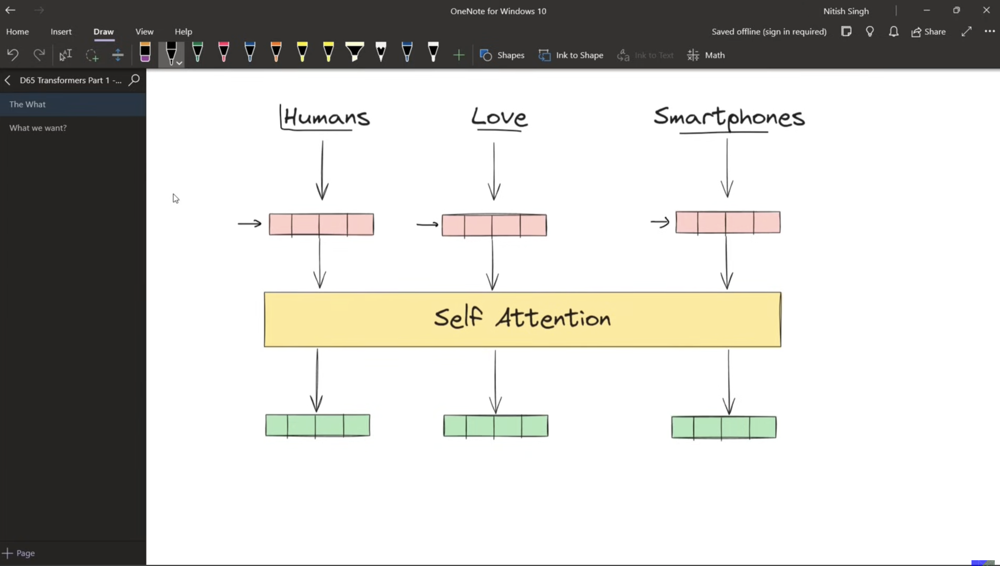
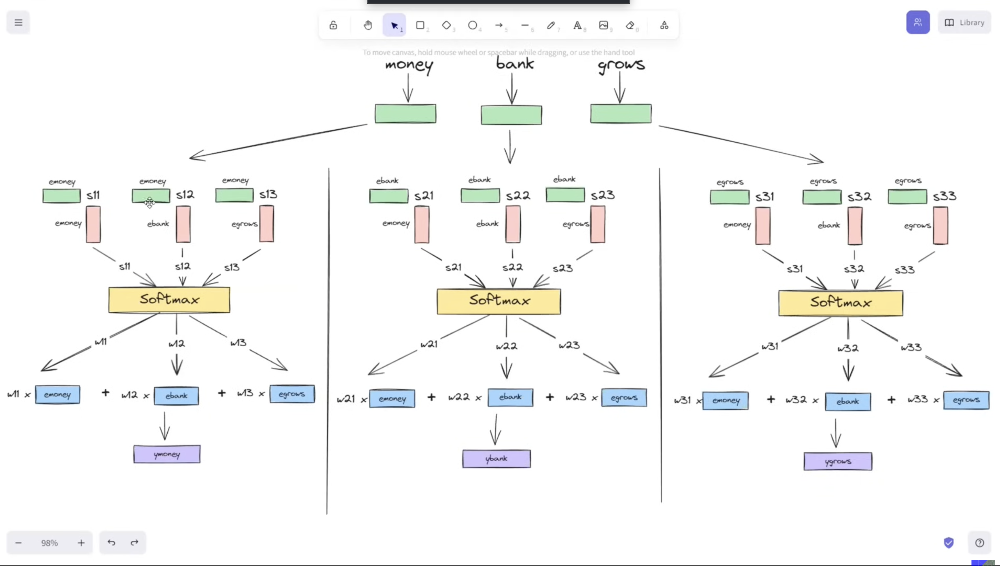
**Step 1: Represent each word by its static embedding.**
Suppose we have the sentence: "money bank grows". Let the embeddings be:
- e1 = embedding of "money"
- e2 = embedding of "bank"
- e3 = embedding of "grows"

Each e is a vector of dimension *n* (e.g., 100 or 300).

**Step 2: For a target word, compute its similarity (dot product) with every word in the sentence (including itself).**
For example, to get the contextual embedding of "bank" (e2), we compute:
- s21 = dot product of e2 (bank) with e1 (money)
- s22 = dot product of e2 (bank) with itself
- s23 = dot product of e2 (bank) with e3 (grows)

These *s* values represent **similarities** – how much each word relates to "bank".

**Step 3: Normalize these similarities into probabilities using the softmax function.**
We compute:
- w21 = softmax(s21)
- w22 = softmax(s22)
- w23 = softmax(s23)

Now w21 + w22 + w23 = 1. These are **attention weights**.

**Step 4: Compute the new contextual embedding as a weighted sum of the original embeddings.**
New embedding of "bank" = (w21 × e1) + (w22 × e2) + (w23 × e3)

This new vector is **contextual** because it contains information from all words, weighted by their similarity to "bank".

**Repeat for every word:** Do the same for "money" and "grows" to get their contextual embeddings.

---

### 3. Key Points
- The simple model uses **dot products** to measure similarity between words.
- **Softmax** turns raw similarity scores into normalized weights (sum to 1).
- The final contextual embedding is a **weighted sum** of all word embeddings in the sentence.
- This process is repeated for each word independently.

---

### 4. Syntax/Structure (Matrix Form – for Parallelization)
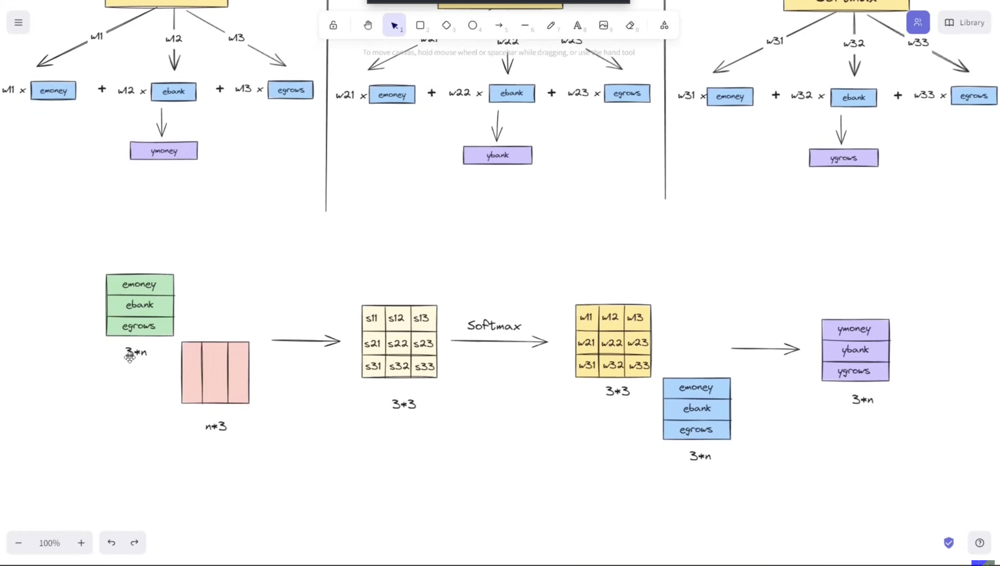
The transcript shows that we can do all these operations in one go using matrices:

- Let **E** be a matrix of size *(number of words) × (embedding dimension)* – each row is a word's embedding.
- Compute **S = E × Eᵀ** – this gives a matrix of all pairwise dot products (similarities).
- Apply softmax row-wise to get **W** (attention weight matrix).
- Compute **Y = W × E** – this gives the new contextual embeddings for all words in one step.

This is powerful because **matrix multiplication is highly parallelizable** on GPUs.

---

### 5. Output (for one word, e.g., "bank")
Suppose:
- e_bank = [1, 0]
- e_money = [2, 3]
- e_grows = [0, 1]

Dot products (raw similarities):
- s21 = e_bank · e_money = 1*2 + 0*3 = 2
- s22 = e_bank · e_bank = 1*1 + 0*0 = 1
- s23 = e_bank · e_grows = 1*0 + 0*1 = 0

Softmax (approximate):
- w21 ≈ 0.65, w22 ≈ 0.24, w23 ≈ 0.11

New contextual embedding for "bank" = 0.65×[2,3] + 0.24×[1,0] + 0.11×[0,1] = [1.54, 1.95]

Notice that "bank" now borrows features from "money" (because they are similar) – this is context!

---

### 6. Common Mistakes
- **Mistake:** Forgetting that we use *the same embeddings* for all three roles (query, key, value are not separated yet – that comes later).
- **Why it's wrong:** In this simple version, the embedding is used directly. This is intentional for now.
- **Mistake:** Applying softmax across the whole matrix incorrectly. Softmax is applied **row-wise** (each row sums to 1).
- **How to avoid:** Always ensure softmax is per row, representing attention for one word.

---

### 7. Interview/Exam Questions
**Q1:** Explain, step by step, how the simple self-attention model computes a contextual embedding for a word.
**A1:** (1) Get the static embedding of the word. (2) Compute dot products with all words in the sentence – these are similarity scores. (3) Apply softmax to get attention weights. (4) Compute weighted sum of all embeddings using these weights. The result is the contextual embedding.

**Q2:** What is the advantage of expressing self-attention in matrix form?
**A2:** Matrix operations can be computed in parallel on GPUs, making the process extremely fast – even for long sentences.

---

### 8. Revision Notes
- Simple self-attention: dot product → softmax → weighted sum.
- All operations are matrix-based → parallelizable.
- Generates **general** contextual embeddings (not task-specific).
- Major drawback: **no learnable parameters** – model cannot adapt to specific tasks or data.

---



## Topic 3: Limitations of the Simple Model – The Need for Learnable Parameters
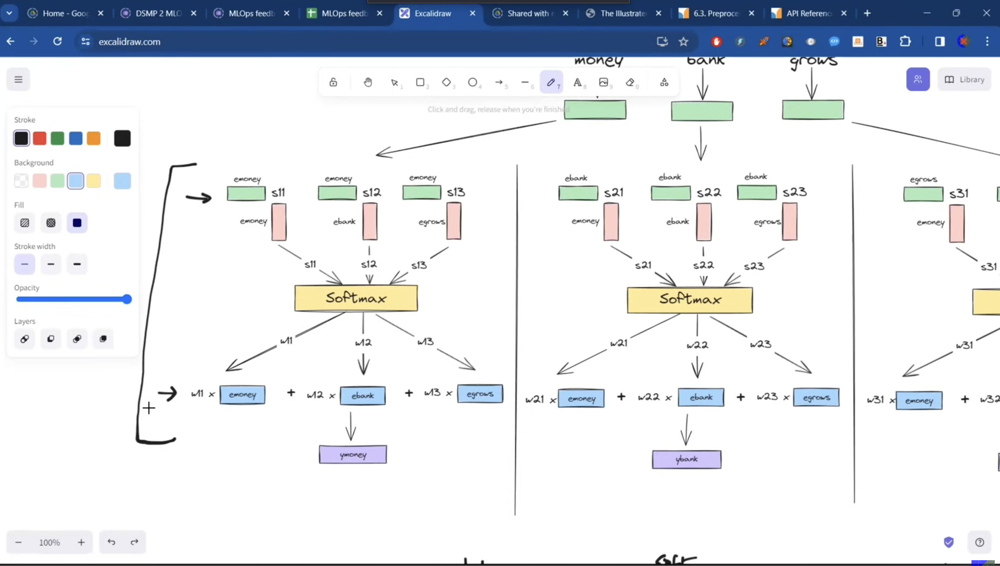
### 1. Introduction
The simple self-attention model we built can generate contextual embeddings, but it has a critical flaw: **it contains no learnable parameters** (no weights or biases). This means it cannot learn from data or adapt to specific tasks.

**Why important:** In machine learning, the ability to learn from data is what makes models powerful. Without learnable parameters, the model is static and generic – it gives the same type of context regardless of the task (translation, sentiment analysis, etc.).

**Real-life use:** Think of it like a one-size-fits-all tool – it works okay for basic tasks but fails in specialized scenarios. For example, translating idioms like "piece of cake" requires task-specific understanding that a generic model cannot provide.

---

### 2. Detailed Explanation

**The core limitation: No learning happens.**

In the simple model, every operation is fixed:
- Dot product (no parameters)
- Softmax (no parameters)
- Weighted sum (no parameters)

There is **no way** for the model to adjust its behavior based on training data.

**Why task-specific embeddings matter:**

The speaker gives two powerful examples:

1. **"piece of cake"**
   - Literal meaning: a small piece of cake.
   - Idiomatic meaning: something very easy.
   - A generic contextual embedding would treat it literally, leading to poor translation (e.g., "cake piece" instead of "very easy").
   - A task-specific (translation) embedding would learn from data that this phrase means "easy" in context.

2. **"break a leg"**
   - Literal meaning: physically break a leg.
   - Idiomatic meaning: good luck.
   - Again, generic context fails; task-specific learning succeeds.

**The key insight:**

> General contextual embeddings are useful, but **task-specific contextual embeddings** are far more powerful. The model must learn from the data of the specific task (e.g., translation pairs, sentiment-labeled texts) to generate embeddings optimized for that task.

**What the simple model generates:**  
General contextual embeddings – they depend on the sentence but not on the task.  
**What we need:**  
Task-specific contextual embeddings – they depend on both the sentence *and* the task we're performing.

**How to achieve this:**  
Introduce **learnable parameters** (weights and biases) into the self-attention mechanism. These parameters will be updated during training via backpropagation, allowing the model to learn what context is important for the given task.

---

### 3. Key Points
- Simple self-attention has **zero learnable parameters** – it cannot improve with data.
- It generates **general** contextual embeddings, not **task-specific** ones.
- Task-specific embeddings are crucial for real-world applications (translation, sentiment analysis, etc.).
- Without learning, the model cannot capture idioms, domain-specific meanings, or nuance.
- The solution is to introduce learnable weights into the attention mechanism.

---

### 4. Common Mistakes
- **Mistake:** Thinking that any contextual embedding is good enough for all tasks.
- **Why it's wrong:** A translation task requires different contextual emphasis than a sentiment analysis task. One-size-fits-all doesn't work.
- **How to avoid:** Always consider whether your model has the capacity to learn from task-specific data.

- **Mistake:** Confusing "no parameters" with "simple" – assuming simple is always worse.
- **Why it's wrong:** The simple model is excellent for understanding *how* attention works. The limitation is about *learning*, not about the core mechanism.

---

### 5. Interview/Exam Questions
**Q1:** What is the main disadvantage of the simple self-attention model without learnable parameters?
**A1:** It generates only general contextual embeddings and cannot adapt to specific NLP tasks (like translation or sentiment analysis). It cannot learn from training data, so it fails on idioms, domain-specific meanings, and nuanced contexts.

**Q2:** Why are task-specific contextual embeddings better than general ones? Give an example.
**A2:** For translation, the phrase "piece of cake" should be translated as "very easy," not literally "cake piece." A general embedding would treat it literally, while a task-specific embedding would learn the idiomatic meaning from translation data.

---

### 6. Revision Notes
- No learnable parameters = no adaptation to task/data.
- Simple model → general contextual embeddings.
- We need task-specific embeddings for real-world performance.
- Solution: Add learnable weights (via matrices) to the attention mechanism.
- The next step: introduce **Query, Key, and Value** vectors with learnable transformations.

---



## Topic 4: Introducing Query, Key, and Value – The Need for Separation
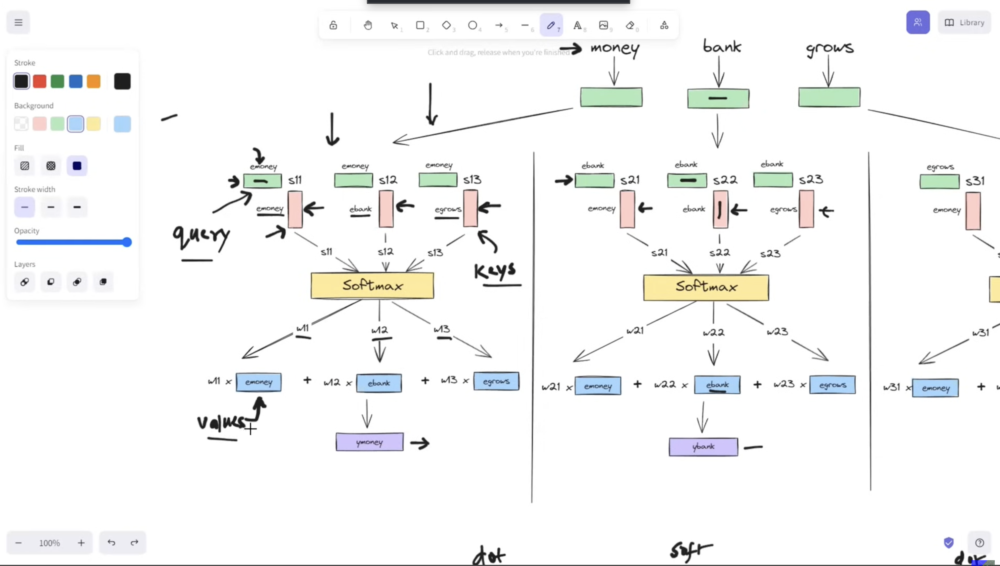
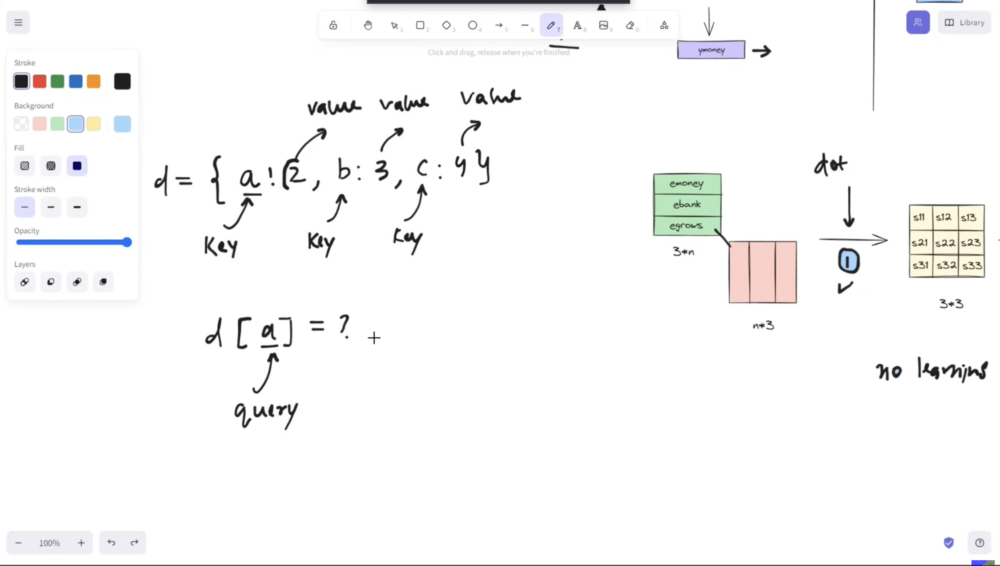
### 1. Introduction
Now that we know we need learnable parameters, the next big insight is that each word embedding plays **three different roles** in the attention process. In the simple model, the same vector is used for all three roles, but this is inefficient.

**Why important:** Separating these roles allows each to be optimized for its specific function, leading to better contextual embeddings. This is the foundation of the actual self-attention mechanism used in Transformers.

**Real-life use:** Think of an author's autobiography. Using the same raw text for your profile, search query, and conversation style would be disastrous. You need *different, optimized versions* of the same information for each purpose.

---

### 2. Detailed Explanation

**The Three Roles: Query, Key, and Value**

In the attention process, every word's embedding is used in three distinct ways:

| Role | Symbol | Function | Analogy |
|------|--------|----------|---------|
| **Query** | Q | Asks the question: "How similar am I to other words?" | Your **search preferences** when looking for a partner |
| **Key** | K | Answers the query: "Here's how similar I am to you." | Your **profile** that others see when searching |
| **Value** | V | Provides the actual content to be used in the weighted sum | Your **conversation style** when interacting |

**The Problem with Using One Vector for All Three Roles**

In the simple model:
- The same embedding vector (e_bank) is used as Query, Key, and Value.
- This is like an author uploading their entire 300-page autobiography as their profile, search query, *and* conversation style.

**Why this is bad:**
1. **Profile (Key):** Too much irrelevant information. A girl won't read 300 pages to understand you.
2. **Search (Query):** Vague and unfiltered. The website can't find suitable matches if you dump everything into the search bar.
3. **Conversation (Value):** Oversharing. You wouldn't talk about your illnesses or bad habits on a first date.

**The Solution: Transform One Vector into Three Specialized Vectors**

Instead of using e_bank directly for all roles, we create three *new* vectors from it:
- **q_bank** (Query vector) – optimized for asking similarity questions.
- **k_bank** (Key vector) – optimized for answering similarity questions.
- **v_bank** (Value vector) – optimized for providing content in the weighted sum.

This is like the author creating:
- A **polished profile** (Key) – highlights best qualities.
- A **specific search filter** (Query) – states clear preferences.
- A **charming conversation style** (Value) – shares only the best aspects.

**How to create these specialized vectors:**
We use **linear transformations** – multiply the original embedding by three different weight matrices.

---

### 3. Key Points
- Every word embedding must serve three roles: **Query**, **Key**, and **Value**.
- Using the same vector for all three is inefficient and suboptimal.
- We need to transform one embedding into three **specialized vectors**.
- This separation allows each vector to be optimized for its specific task.
- The transformation is done via **learnable weight matrices**.

---

### 4. Common Mistakes
- **Mistake:** Thinking Query, Key, and Value are separate inputs or different words.
- **Why it's wrong:** They all originate from the *same* word embedding but are transformed into different vectors for different purposes.
- **How to avoid:** Remember: one word → one embedding → three vectors (Q, K, V).

- **Mistake:** Assuming the three vectors are completely independent with no shared information.
- **Why it's wrong:** They come from the same original embedding and share the same underlying information, but are optimized for different roles.

---

### 5. Interview/Exam Questions
**Q1:** Why is it a problem to use the same word embedding as Query, Key, and Value?
**A1:** Because each role requires different aspects of the word's meaning. Using one vector for all three means the representation is not optimized for any specific role, leading to suboptimal attention scores and contextual embeddings.

**Q2:** What does the analogy of the author and his autobiography illustrate?
**A2:** It illustrates that the same raw information (the autobiography) needs to be presented differently for different purposes: a profile (Key), a search query (Query), and a conversation style (Value). Similarly, a word embedding must be transformed into three specialized vectors.

---

### 6. Revision Notes
- Query (Q) = asks questions ("How similar am I?").
- Key (K) = answers questions ("Here's my similarity to you.").
- Value (V) = provides content for the weighted sum.
- Same embedding ≠ optimal for all three roles.
- Solution: Learnable transformations to create Q, K, V from the original embedding.
- Separation improves performance because each vector is task-optimized.

---



## Topic 5: Creating Query, Key, and Value Vectors with Learnable Matrices
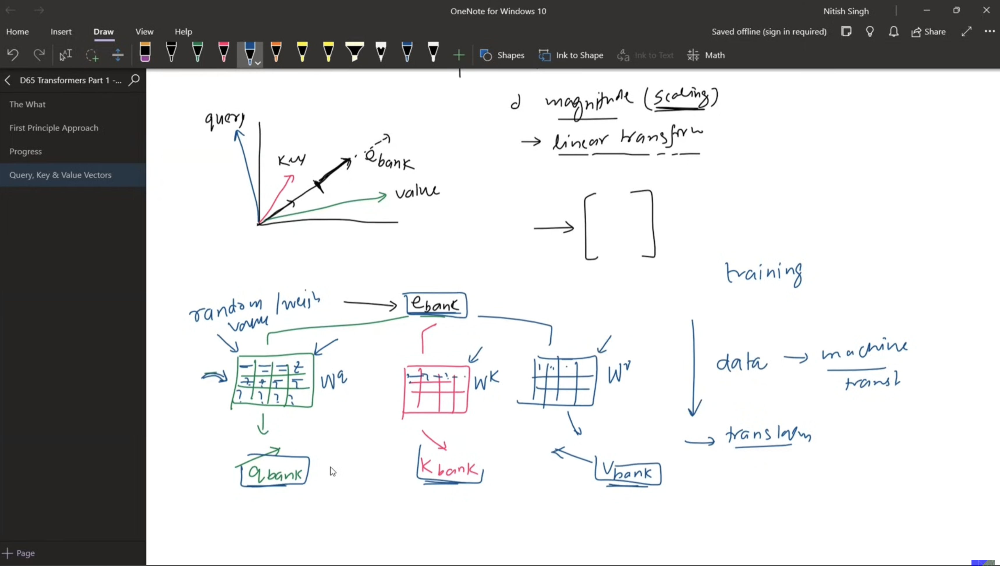

### 1. Introduction
Now that we understand the need to separate Query, Key, and Value, the next question is: **How do we actually create these three vectors from a single word embedding?** The answer lies in **linear transformations** using **learnable weight matrices**.

**Why important:** These matrices are the learnable parameters that make self-attention powerful. They allow the model to adapt to specific tasks by learning optimal transformations from training data.

**Real-life use:** This is the core mechanism that enables Transformers to excel at diverse tasks like translation, text summarization, and question answering.

---

### 2. Detailed Explanation

**The Mathematical Operation: Linear Transformation**

Given an embedding vector **e** (dimension *n*), we create three new vectors by multiplying it with three different matrices:

- **Query vector (q) = e × W_Q**
- **Key vector (k) = e × W_K**
- **Value vector (v) = e × W_V**

Where:
- **W_Q**, **W_K**, **W_V** are weight matrices.
- Each matrix has dimensions *(n × d)*, where *d* is the dimension of the new vectors (often the same as *n*, but can differ).
- These matrices contain **learnable parameters** (numbers) that are updated during training.

**How the Matrices Learn**

1. **Initialize randomly:** At the start, the matrices contain random numbers.
2. **Forward pass:** For each word, we compute q, k, v using these matrices, then perform the attention process (dot products, softmax, weighted sum) to generate contextual embeddings.
3. **Compute loss:** Compare the model's output (e.g., translation) with the ground truth.
4. **Backpropagation:** The error (loss) is propagated backward, and the gradients are used to update the values in W_Q, W_K, and W_V.
5. **Repeat:** Over many training examples, the matrices learn the optimal transformations for the task.

**Key Insight: The Same Matrices Are Shared Across All Words**

- **W_Q**, **W_K**, and **W_V** are **global** – they are the same for every word in the sentence.
- This means every word's embedding is transformed using the exact same weight matrices.
- But because each word's embedding is different, the resulting q, k, v vectors will be different.

**Example with Three Words:**

Sentence: "money bank grows"

- **e_money** → multiplied by W_Q → q_money; by W_K → k_money; by W_V → v_money
- **e_bank** → multiplied by W_Q → q_bank; by W_K → k_bank; by W_V → v_bank
- **e_grows** → multiplied by W_Q → q_grows; by W_K → k_grows; by W_V → v_grows

All words use the **same** W_Q, W_K, W_V, but because their embeddings differ, the resulting q, k, v differ.

**Matrix Form (Parallelization):**

Instead of doing this word-by-word, we stack all embeddings into a matrix **E** (size: *number of words × n*).

Then:
- **Q = E × W_Q** (all query vectors)
- **K = E × W_K** (all key vectors)
- **V = E × W_V** (all value vectors)

This is efficient and fully parallelizable on GPUs.

---

### 3. Key Points
- Query, Key, and Value vectors are created via **linear transformations** (matrix multiplication).
- The transformation uses three **learnable weight matrices**: W_Q, W_K, W_V.
- These matrices are **shared across all words** in the sentence.
- The matrices are **initialized randomly** and **updated via backpropagation** during training.
- The entire process can be expressed in **matrix form** for parallel computation.

---

### 4. Syntax/Structure (Matrix Dimensions)
Let:
- *n* = embedding dimension (e.g., 512)
- *d* = query/key/value dimension (often 64 or 512)
- *T* = number of words in the sentence

Then:
- **E**: *T × n*
- **W_Q**, **W_K**, **W_V**: *n × d*
- **Q**, **K**, **V**: *T × d*

So:
- **Q = E × W_Q**
- **K = E × W_K**
- **V = E × W_V**

---

### 5. Code Example (Conceptual – No Code in Transcript, but Explained)
```python
# Assume E is a matrix of word embeddings (T x n)
# W_Q, W_K, W_V are learnable weight matrices (n x d)

Q = np.dot(E, W_Q)  # Query matrix (T x d)
K = np.dot(E, W_K)  # Key matrix (T x d)
V = np.dot(E, W_V)  # Value matrix (T x d)

# Now compute attention scores: S = Q * K^T
S = np.dot(Q, K.T)  # (T x T)

# Apply softmax row-wise
W = softmax(S, axis=1)  # (T x T)

# Compute contextual embeddings: Y = W * V
Y = np.dot(W, V)  # (T x d)
```

**Explanation:**
- Line 1–3: Compute Q, K, V using matrix multiplication.
- Line 6: Compute similarity scores (dot products between every query and every key).
- Line 9: Convert scores to probabilities (attention weights) using softmax.
- Line 12: Compute the final contextual embeddings as a weighted sum of values.

---

### 6. Common Mistakes
- **Mistake:** Thinking W_Q, W_K, W_V are different for each word.
- **Why it's wrong:** They are shared globally across all words. The differences in q, k, v come from differences in the input embeddings **e**, not from the matrices.
- **How to avoid:** Remember: one set of matrices for the entire sentence.

- **Mistake:** Confusing the dimensions of the matrices.
- **Why it's wrong:** The matrices must be compatible: if embeddings are size *n* and we want query vectors of size *d*, W_Q must be *n × d*.
- **How to avoid:** Always check matrix dimensions: (T × n) × (n × d) = (T × d).

---

### 7. Interview/Exam Questions
**Q1:** How are Query, Key, and Value vectors generated from a word embedding?
**A1:** Each word embedding **e** is multiplied by three different learnable weight matrices: W_Q (for Query), W_K (for Key), and W_V (for Value). The resulting vectors are q = e × W_Q, k = e × W_K, and v = e × W_V.

**Q2:** Why are the weight matrices W_Q, W_K, and W_V shared across all words in a sentence?
**A2:** Sharing ensures that the same transformation rules apply to every word. The differences in q, k, v arise from differences in the input embeddings, not from the matrices. This also reduces the number of parameters and allows the model to learn generalizable transformations.

**Q3:** How do W_Q, W_K, and W_V learn optimal values?
**A3:** They are initialized randomly. During training, the model computes a loss based on the task (e.g., translation error), and backpropagation updates the values in these matrices to minimize the loss over many training examples.

---

### 8. Revision Notes
- Query, Key, Value = linear transformations of the original embedding.
- Transformation: q = e × W_Q, k = e × W_K, v = e × W_V.
- W_Q, W_K, W_V are learnable, shared, and updated via training.
- Matrix form: Q = E × W_Q, K = E × W_K, V = E × W_V.
- This introduces **learnable parameters** into self-attention, making it task-specific.

---



## Topic 6: The Final Refined Self-Attention Mechanism (Complete Overview)

### 1. Introduction
We've now built up all the components: we understand the need for contextual embeddings, the simple attention mechanism, the importance of learnable parameters, and the separation into Query, Key, and Value vectors. Now we put it all together into the **final refined self-attention mechanism** – the one actually used in Transformers.

**Why important:** This is the complete, practical self-attention mechanism that powers modern generative AI. Understanding this gives you the foundation to understand Transformers, BERT, GPT, and all their variants.

**Real-life use:** Every state-of-the-art NLP model (ChatGPT, Bard, Claude, etc.) uses this mechanism to understand and generate text.

---

### 2. Detailed Explanation – The Complete Process
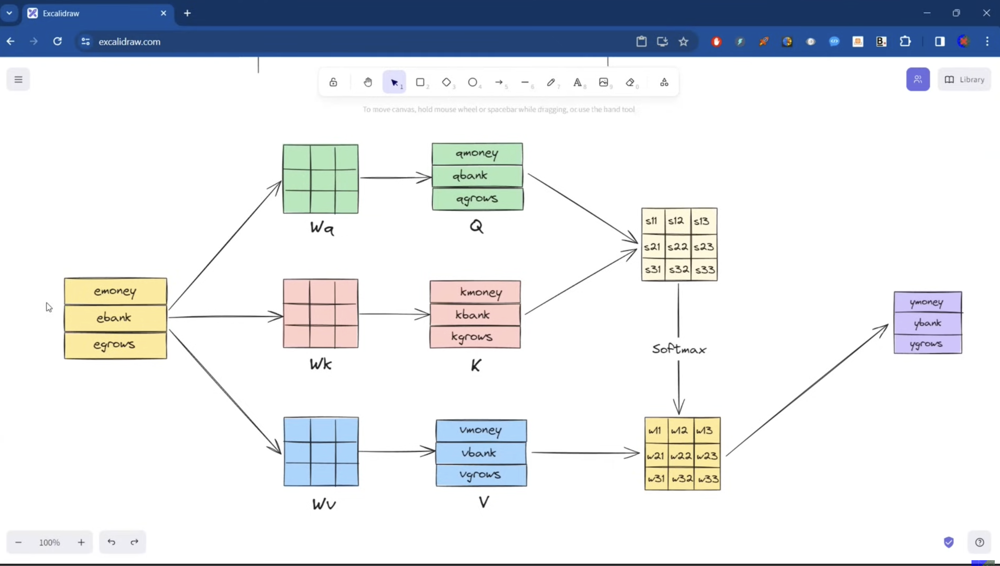
**Step 1: Start with static word embeddings**

Given a sentence with *T* words, we have embeddings:
- e₁, e₂, e₃, ..., e_T

Stack them into a matrix **E** of size *(T × n)*.

**Step 2: Create Query, Key, and Value matrices**

Using the three learnable weight matrices:
- **Q = E × W_Q** (Query matrix, T × d)
- **K = E × W_K** (Key matrix, T × d)
- **V = E × W_V** (Value matrix, T × d)

Each row of Q, K, V corresponds to a word's query, key, and value vectors.

**Step 3: Compute attention scores (similarities)**

We compute the dot product between every query and every key:
- **S = Q × Kᵀ** (Size: T × T)

Each element S_ij represents the similarity (attention score) between the i-th word (query) and the j-th word (key).

**Step 4: Normalize with softmax**

Apply softmax row-wise to convert scores into probabilities:
- **W = softmax(S, axis=1)** (Size: T × T)

Each row sums to 1. W_ij tells us how much attention word *i* should pay to word *j*.

**Step 5: Compute the final contextual embeddings**

Multiply the attention weights by the value matrix:
- **Y = W × V** (Size: T × d)

Each row of Y is the **task-specific contextual embedding** for that word.

**Visual Summary (from the transcript):**

```
Original embeddings (E) → [W_Q, W_K, W_V] → Q, K, V
Then: Q × Kᵀ → S → softmax → W
Finally: W × V → Y (contextual embeddings)
```

**Why this is better than the simple model:**

| Feature | Simple Model | Refined Model |
|---------|--------------|---------------|
| Embeddings used | Directly as Q, K, V | Transformed into specialized Q, K, V |
| Learnable parameters | None | Yes (W_Q, W_K, W_V) |
| Contextual embeddings | General | Task-specific (via learning) |
| Parallelization | Yes (matrix form) | Yes (matrix form) |

**The Power of Parallelization:**

Even with the added complexity, the entire process is still just matrix multiplications:
- E × W_Q, E × W_K, E × W_V
- Q × Kᵀ
- softmax
- W × V

All of these can be computed in parallel on GPUs. Whether your sentence has 10 words or 10,000 words, the operations are the same – just larger matrices. This is why Transformers can handle very long sequences efficiently.

---

### 3. Key Points
- The refined self-attention has **three core steps**: (1) transform embeddings to Q, K, V, (2) compute and normalize similarity scores, (3) weight values.
- All operations are **matrix-based**, enabling full parallelization.
- The **learnable matrices** (W_Q, W_K, W_V) make the attention **task-specific**.
- This is the exact mechanism used in the Transformer architecture.
- The output **Y** contains contextual embeddings for every word in the sentence.

---

### 4. Syntax/Structure (Complete Matrix Form)
Let:
- *T* = number of words
- *n* = embedding dimension
- *d* = query/key/value dimension

**Input:** E (T × n)

**Step 1:** Q = E × W_Q, K = E × W_K, V = E × W_V  
(where W_Q, W_K, W_V are n × d)

**Step 2:** S = Q × Kᵀ (T × T)

**Step 3:** W = softmax(S) (applied row-wise)

**Step 4:** Y = W × V (T × d)

**Output:** Y (contextual embeddings, T × d)

---

### 5. Code Example (Conceptual Python with NumPy)
```python
import numpy as np

# Assume we have:
# E: word embeddings (T x n)
# W_Q, W_K, W_V: learnable weight matrices (n x d)
# d: dimension of Q, K, V (e.g., 64)

# Step 1: Create Q, K, V
Q = np.dot(E, W_Q)  # (T x d)
K = np.dot(E, W_K)  # (T x d)
V = np.dot(E, W_V)  # (T x d)

# Step 2: Compute attention scores
S = np.dot(Q, K.T)  # (T x T) - dot product of every query with every key

# Step 3: Apply softmax row-wise
def softmax_rowwise(matrix):
    exp_matrix = np.exp(matrix - np.max(matrix, axis=1, keepdims=True))  # for numerical stability
    return exp_matrix / np.sum(exp_matrix, axis=1, keepdims=True)

W = softmax_rowwise(S)  # (T x T) - attention weights

# Step 4: Compute contextual embeddings
Y = np.dot(W, V)  # (T x d) - final contextual embeddings

# Y now contains task-specific contextual embeddings for all words
```

**Line-by-line explanation:**
- Line 7–9: Transform embeddings into Q, K, V using the learnable matrices.
- Line 12: Compute similarity scores (dot products) between all queries and keys.
- Line 15–17: Softmax function applied to each row to get attention weights (probabilities).
- Line 20: Multiply attention weights by values to get final contextual embeddings.

---

### 6. Common Mistakes
- **Mistake:** Forgetting to apply softmax row-wise (not column-wise).
- **Why it's wrong:** Each word should have its own probability distribution over all other words. Row-wise softmax ensures each row sums to 1.
- **How to avoid:** Always specify `axis=1` (or `dim=1`) when applying softmax.

- **Mistake:** Thinking the final output Y has the same dimension as the original embeddings.
- **Why it's wrong:** Y has dimension *d* (the query/key/value dimension), which may differ from the original embedding dimension *n*.
- **How to avoid:** Check the dimensions: Y is T × d, not T × n.

- **Mistake:** Confusing the simple model (no learnable params) with the refined model (has learnable params).
- **Why it's wrong:** They are fundamentally different – one is static, the other learns from data.
- **How to avoid:** Remember: refined model = W_Q, W_K, W_V; simple model = no matrices.

---

### 7. Interview/Exam Questions
**Q1:** Write the matrix equations for the complete self-attention mechanism.
**A1:** Given E (word embeddings), W_Q, W_K, W_V:
- Q = E × W_Q
- K = E × W_K
- V = E × W_V
- S = Q × Kᵀ
- W = softmax(S)  (row-wise)
- Y = W × V

**Q2:** Why is the refined self-attention mechanism considered "task-specific"?
**A2:** Because it contains learnable weight matrices (W_Q, W_K, W_V) that are updated during training based on the task's data. This allows the model to learn which aspects of context are important for that specific task (e.g., translation vs. sentiment analysis).

**Q3:** How does self-attention handle sequences of arbitrary length?
**A3:** Since all operations are matrix-based (Q, K, V, S, W, Y), the mechanism works for any sequence length *T*. The matrices simply grow in size. This, combined with GPU parallelization, allows efficient processing of long sequences.

**Q4:** What is the role of the softmax function in self-attention?
**A4:** Softmax converts raw similarity scores (dot products) into a probability distribution (weights) that sums to 1 for each word. This ensures that the attention weights are interpretable as "how much focus" each word should give to every other word.

---

### 8. Revision Notes (Complete Self-Attention Summary)
- **Input:** Static word embeddings (E).
- **Learnable parameters:** W_Q, W_K, W_V (trained on data).
- **Transform:** Q = E × W_Q, K = E × W_K, V = E × W_V.
- **Similarities:** S = Q × Kᵀ (dot products).
- **Normalize:** W = softmax(S) (row-wise).
- **Contextual output:** Y = W × V (task-specific contextual embeddings).
- **Key advantages:** Learnable, parallelizable, task-specific, sequence-length agnostic.
- **This is the core of Transformer architecture.**

---

**We have now covered all topics from the transcript!** 🎉

